### Imports

In [116]:
import pandas as pd
import numpy as np
import geopandas as gpd

In [117]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline 
mpl.rcParams['figure.dpi'] = 300

In [118]:
from sklearn.preprocessing import Normalizer

In [119]:
from chart_studio import plotly
import plotly.figure_factory as ff

In [120]:
pd.options.display.max_rows = 4000
pd.options.display.max_columns = 4000

In [121]:
DATA_VERSION = 'v6'

In [122]:
gov_arch_csv = '../data/' + DATA_VERSION + '/communities_data_prepped.csv'

In [123]:
fig_dir = '../' + DATA_VERSION + '-fig/fig-communities/'

In [124]:
gov_df = pd.read_csv(gov_arch_csv)

In [125]:
gov_df.head()

,Name,Institutions,Mechanism,Notes,Time span,Geography,Continent,Size,Source,Metanotes,Heterogeneity,FC comments,expert check,Time span: Start,Time span: End,SCCS,is_SCCS,decision_making_mechanisms_include_consensus,decision_making_mechanisms_include_board_committee,decision_making_mechanisms_include_veto,enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,access_mechanisms_include_dreaming,decision_making_mechanisms_include_president_consul_chief_executive,access_mechanisms_include_child_participation,decision_making_mechanisms_include_assembly_central,enforcement_mechanisms_include_reputational_risk,access_mechanisms_include_open_political_unit,enforcement_mechanisms_include_destruction_of_property,decision_making_mechanisms_include_autocratic_leader_unbound,decision_making_mechanisms_include_rule_of_law,access_mechanisms_include_meritocracy,decision_making_mechanisms_include_council_central_,decision_making_mechanisms_include_bureaucracy,decision_making_mechanisms_include_majority_voting,decision_making_mechanisms_include_vote_by_proxy,decision_making_mechanisms_include_agenda_setting,decision_making_mechanisms_include_dual-sex_political_system,decision_making_mechanisms_include_constitution,decision_making_mechanisms_include_voting,enforcement_mechanisms_include_scrutiny_of_officials,decision_making_mechanisms_include_checks_and_balances,access_mechanisms_include_age_boundaries,decision_making_mechanisms_include_vote_by_show_of_hands,enforcement_mechanisms_include_judicial_review,access_mechanisms_include_payment_for_occupying_office,enforcement_mechanisms_include_self-help,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_consultation,enforcement_mechanisms_include_fines,enforcement_mechanisms_include_arbitration,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_balance_of_power,decision_making_mechanisms_include_delegation,access_mechanisms_include_blood_relations,decision_making_mechanisms_include_lobbying,decision_making_mechanisms_include_confederacy,access_mechanisms_include_heredity,enforcement_mechanisms_include_police,decision_making_mechanisms_include_representation,access_mechanisms_include_enfranchisement,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_assembly_local,access_mechanisms_include_election,access_mechanisms_include_female_participation,decision_making_mechanisms_include_remunerated_position,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_deliberation,decision_making_mechanisms_include_oath,decision_making_mechanisms_include_supermajority,decision_making_mechanisms_include_plurality_voting,decision_making_mechanisms_include_ratification_acclamation_only,access_mechanisms_include_property_requirement,access_mechanisms_include_gerontocracy,decision_making_mechanisms_include_coalition,decision_making_mechanisms_include_temporary_position_of_power_term_limits,decision_making_mechanisms_include_turnover_rotation,enforcement_mechanisms_include_paying_damages_compensation,enforcement_mechanisms_include_negotiation,enforcement_mechanisms_include_appeal,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_quorum,access_mechanisms_include_life_appointment,decision_making_mechanisms_include_kingchief-as-figurehead,decision_making_mechanisms_include_power_fluidity,access_mechanisms_include_matrilineality,access_mechanisms_include_popularity_,access_mechanisms_include_screening_process,decision_making_mechanisms_include_frequent_and_or_regular_meetings,enforcement_mechanisms_include_seizing_of_property,access_mechanisms_include_matriarchy,decision_making_mechanisms_include_leader_first_among_equals,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_exit,enforcement_mechanisms_include_civil_disobedience,decision_making_mechanisms_include_consent,decision_making_mech

In [126]:
gov_df.dtypes

Name                                                                               object
Institutions                                                                       object
Mechanism                                                                          object
Notes                                                                              object
Time span                                                                          object
Geography                                                                          object
Continent                                                                          object
Size                                                                               object
Source                                                                             object
Metanotes                                                                          object
Heterogeneity                                                                      object
FC comment

## Descriptive analysis

## Histograms

In [127]:
list(gov_df.columns)

['Name',
 'Institutions',
 'Mechanism',
 'Notes',
 'Time span',
 'Geography',
 'Continent',
 'Size',
 'Source',
 'Metanotes',
 'Heterogeneity ',
 'FC comments',
 'expert check',
 'Time span: Start',
 'Time span: End',
 'SCCS',
 'is_SCCS',
 'decision_making_mechanisms_include_consensus',
 'decision_making_mechanisms_include_board_committee',
 'decision_making_mechanisms_include_veto',
 'enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator',
 'access_mechanisms_include_dreaming',
 'decision_making_mechanisms_include_president_consul_chief_executive',
 'access_mechanisms_include_child_participation',
 'decision_making_mechanisms_include_assembly_central',
 'enforcement_mechanisms_include_reputational_risk',
 'access_mechanisms_include_open_political_unit',
 'enforcement_mechanisms_include_destruction_of_property',
 'decision_making_mechanisms_include_autocratic_leader_unbound',
 'decision_making_mechanisms_include_rule_of_law',
 'access_mechanisms_include_merito

In [128]:
mechanisms_list = [x for x in gov_df.columns if 'mechanisms' in x]
mechanisms_list

['decision_making_mechanisms_include_consensus',
 'decision_making_mechanisms_include_board_committee',
 'decision_making_mechanisms_include_veto',
 'enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator',
 'access_mechanisms_include_dreaming',
 'decision_making_mechanisms_include_president_consul_chief_executive',
 'access_mechanisms_include_child_participation',
 'decision_making_mechanisms_include_assembly_central',
 'enforcement_mechanisms_include_reputational_risk',
 'access_mechanisms_include_open_political_unit',
 'enforcement_mechanisms_include_destruction_of_property',
 'decision_making_mechanisms_include_autocratic_leader_unbound',
 'decision_making_mechanisms_include_rule_of_law',
 'access_mechanisms_include_meritocracy',
 'decision_making_mechanisms_include_council_central_',
 'decision_making_mechanisms_include_bureaucracy',
 'decision_making_mechanisms_include_majority_voting',
 'decision_making_mechanisms_include_vote_by_proxy',
 'decision_makin

In [129]:
# mechanisms_df = gov_df[['Name'] + mechanisms_list]
mechanisms_df = gov_df[mechanisms_list]

In [130]:
mechanisms_df

,decision_making_mechanisms_include_consensus,decision_making_mechanisms_include_board_committee,decision_making_mechanisms_include_veto,enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,access_mechanisms_include_dreaming,decision_making_mechanisms_include_president_consul_chief_executive,access_mechanisms_include_child_participation,decision_making_mechanisms_include_assembly_central,enforcement_mechanisms_include_reputational_risk,access_mechanisms_include_open_political_unit,enforcement_mechanisms_include_destruction_of_property,decision_making_mechanisms_include_autocratic_leader_unbound,decision_making_mechanisms_include_rule_of_law,access_mechanisms_include_meritocracy,decision_making_mechanisms_include_council_central_,decision_making_mechanisms_include_bureaucracy,decision_making_mechanisms_include_majority_voting,decision_making_mechanisms_include_vote_by_proxy,decision_making_mechanisms_include_agenda_setting,decision_making_mechanisms_include_dual-sex_political_system,decision_making_mechanisms_include_constitution,decision_making_mechanisms_include_voting,enforcement_mechanisms_include_scrutiny_of_officials,decision_making_mechanisms_include_checks_and_balances,access_mechanisms_include_age_boundaries,decision_making_mechanisms_include_vote_by_show_of_hands,enforcement_mechanisms_include_judicial_review,access_mechanisms_include_payment_for_occupying_office,enforcement_mechanisms_include_self-help,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_consultation,enforcement_mechanisms_include_fines,enforcement_mechanisms_include_arbitration,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_balance_of_power,decision_making_mechanisms_include_delegation,access_mechanisms_include_blood_relations,decision_making_mechanisms_include_lobbying,decision_making_mechanisms_include_confederacy,access_mechanisms_include_heredity,enforcement_mechanisms_include_police,decision_making_mechanisms_include_representation,access_mechanisms_include_enfranchisement,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_assembly_local,access_mechanisms_include_election,access_mechanisms_include_female_participation,decision_making_mechanisms_include_remunerated_position,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_deliberation,decision_making_mechanisms_include_oath,decision_making_mechanisms_include_supermajority,decision_making_mechanisms_include_plurality_voting,decision_making_mechanisms_include_ratification_acclamation_only,access_mechanisms_include_property_requirement,access_mechanisms_include_gerontocracy,decision_making_mechanisms_include_coalition,decision_making_mechanisms_include_temporary_position_of_power_term_limits,decision_making_mechanisms_include_turnover_rotation,enforcement_mechanisms_include_paying_damages_compensation,enforcement_mechanisms_include_negotiation,enforcement_mechanisms_include_appeal,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_quorum,access_mechanisms_include_life_appointment,decision_making_mechanisms_include_kingchief-as-figurehead,decision_making_mechanisms_include_power_fluidity,access_mechanisms_include_matrilineality,access_mechanisms_include_popularity_,access_mechanisms_include_screening_process,decision_making_mechanisms_include_frequent_and_or_regular_meetings,enforcement_mechanisms_include_seizing_of_property,access_mechanisms_include_matriarchy,decision_making_mechanisms_include_leader_first_among_equals,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_exit,enforcement_mechanisms_include_civil_disobedience,decision_making_mechanisms_include_consent,decision_making_mechanisms_include_mandate,access_mechanisms_include_induction_rite_ceremony,access_mechanisms_include_lottery_random_selection,enforcement_mechanisms_include_monitoring,enfo

In [131]:
mechanisms_df.sum().sort_values(ascending=False)

decision_making_mechanisms_include_magistrate_official                             61
decision_making_mechanisms_include_council_central_                                53
access_mechanisms_include_heredity                                                 40
access_mechanisms_include_meritocracy                                              40
decision_making_mechanisms_include_autocratic_leader_chief_bound                   38
access_mechanisms_include_gerontocracy                                             36
decision_making_mechanisms_include_deliberation                                    34
access_mechanisms_include_election                                                 28
decision_making_mechanisms_include_council_local                                   28
decision_making_mechanisms_include_assembly_central                                27
decision_making_mechanisms_include_consensus                                       25
decision_making_mechanisms_include_representation     

<Axes: >

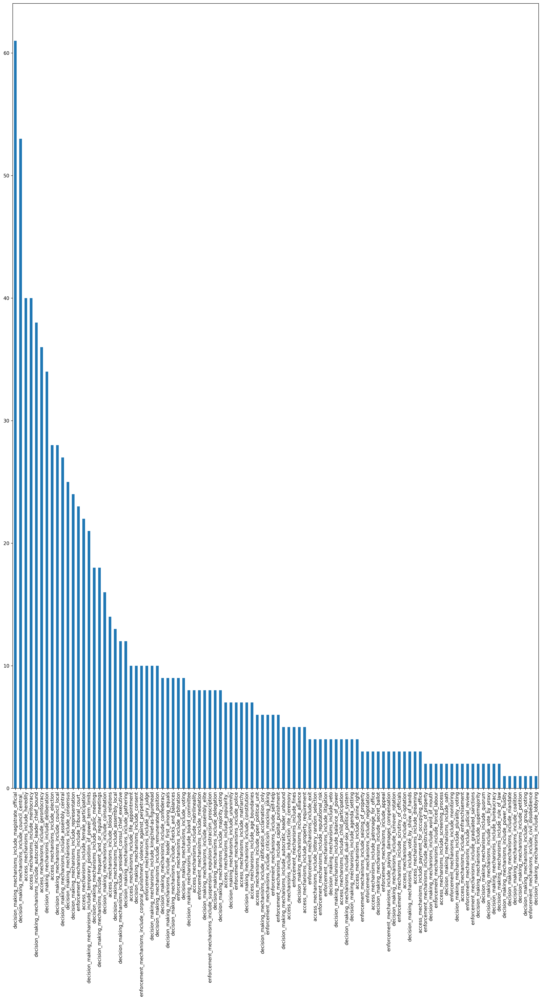

In [132]:
mechanisms_df.sum().sort_values(ascending=False).plot(kind='bar', figsize=(20,30))

## By Mechanism category

In [133]:
access_mechanisms = [x for x in gov_df.columns if 'access_mechanisms_' in x]

<Axes: >

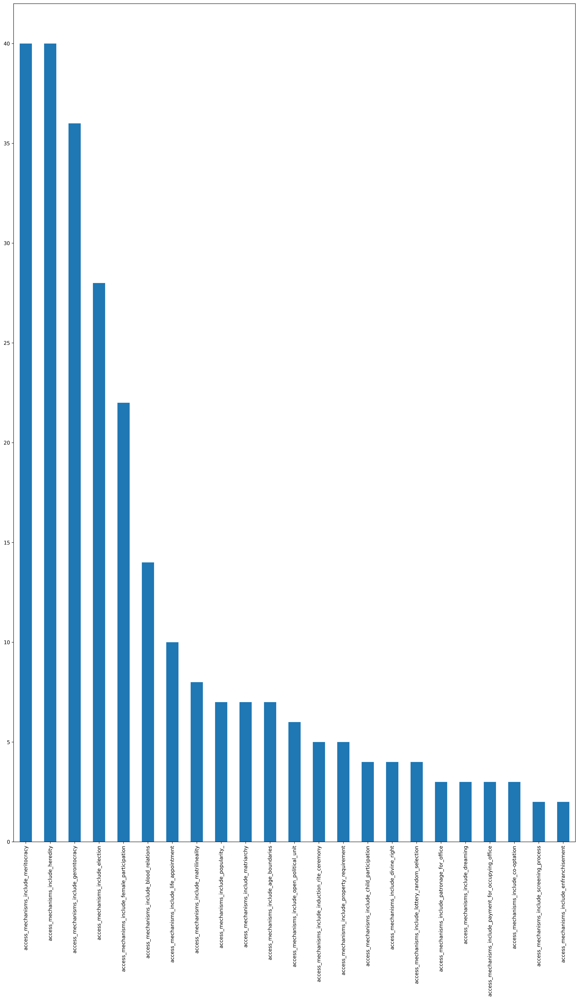

In [134]:
gov_df[access_mechanisms].sum().sort_values(ascending=False).plot(kind='bar', figsize=(20,30))

In [135]:
decision_making_mechanisms = [x for x in gov_df.columns if 'decision_making_mechanisms_' in x]

<Axes: >

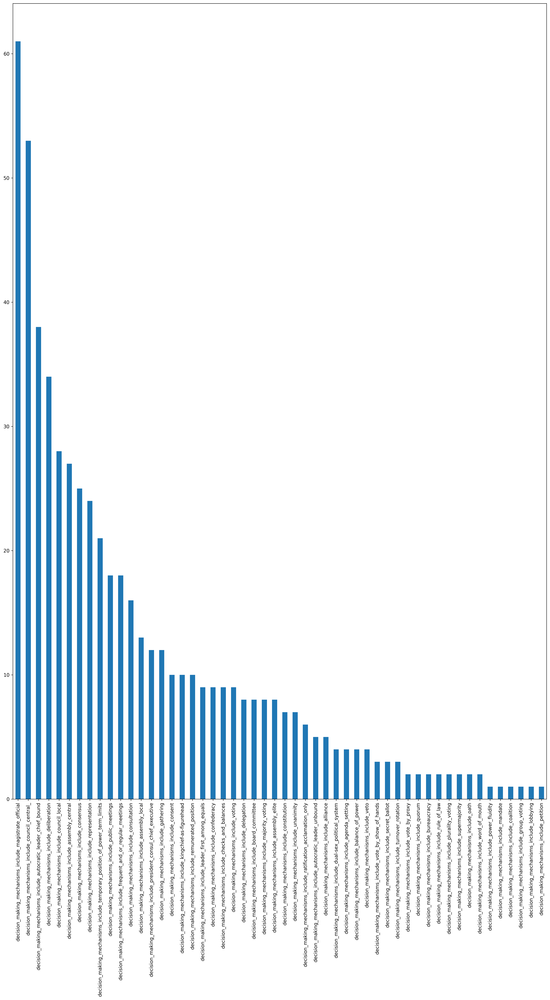

In [136]:
gov_df[decision_making_mechanisms].sum().sort_values(ascending=False).plot(kind='bar', figsize=(20,30))

In [137]:
enforcement_mechanisms = [x for x in gov_df.columns if 'enforcement_mechanisms_' in x]

<Axes: >

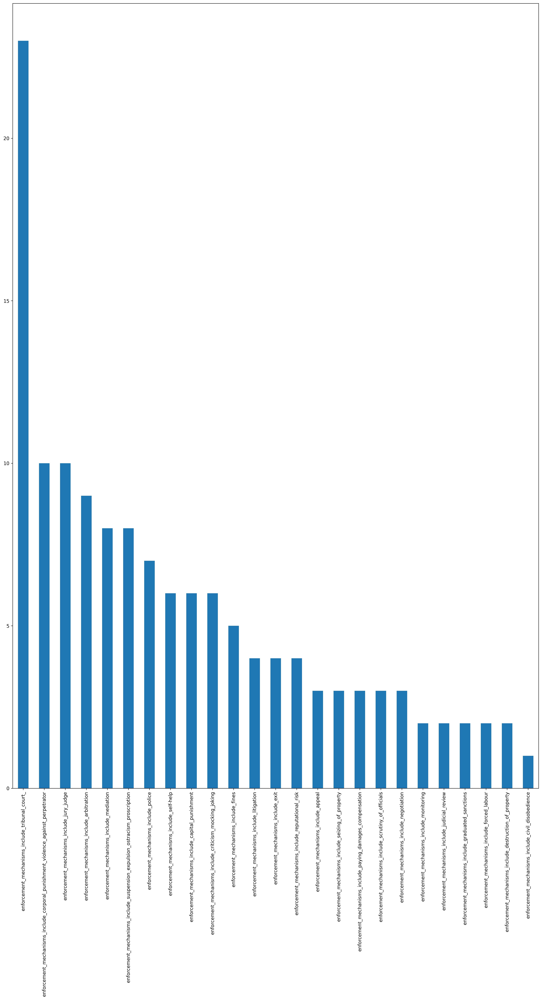

In [138]:
gov_df[enforcement_mechanisms].sum().sort_values(ascending=False).plot(kind='bar', figsize=(20,30))

### Values

In [139]:
# values_list = [x for x in gov_df.columns if x.startswith('values')]
# values_list

In [140]:
# values_df = gov_df[['Name'] + values_list]
# values_df = gov_df[values_list]

In [141]:
# values_df

In [142]:
# values_df.sum().sort_values(ascending=False)

In [143]:
# values_df.sum().sort_values(ascending=False).plot(kind='bar', figsize=(10,30))

Note:
- Mechanisms are not mutually exclusive! Many/most institutions involve multiple mechanisms.
- Values are also not mutually exclusive! Many/most institutions involve multiple values. 

### Size

In [144]:
gov_df['Size'].value_counts()

Size
10,001 - 100,000          37
1,001 - 10,000            22
100,001 - 1,000,000       10
Unknown                    7
1,000,001 - 10,000,000     6
100 - 1,000                5
10,000,000+                4
Name: count, dtype: int64

In [145]:
gov_df['Size']

0        100,001 - 1,000,000
1           10,001 - 100,000
2           10,001 - 100,000
3                    Unknown
4             1,001 - 10,000
5        100,001 - 1,000,000
6        100,001 - 1,000,000
7           10,001 - 100,000
8        100,001 - 1,000,000
9           10,001 - 100,000
10               10,000,000+
11                   Unknown
12          10,001 - 100,000
13          10,001 - 100,000
14          10,001 - 100,000
15          10,001 - 100,000
16    1,000,001 - 10,000,000
17    1,000,001 - 10,000,000
18            1,001 - 10,000
19          10,001 - 100,000
20          10,001 - 100,000
21          10,001 - 100,000
22          10,001 - 100,000
23          10,001 - 100,000
24          10,001 - 100,000
25                   Unknown
26          10,001 - 100,000
27    1,000,001 - 10,000,000
28          10,001 - 100,000
29            1,001 - 10,000
30          10,001 - 100,000
31          10,001 - 100,000
32          10,001 - 100,000
33               10,000,000+
34            

<Axes: xlabel='Size'>

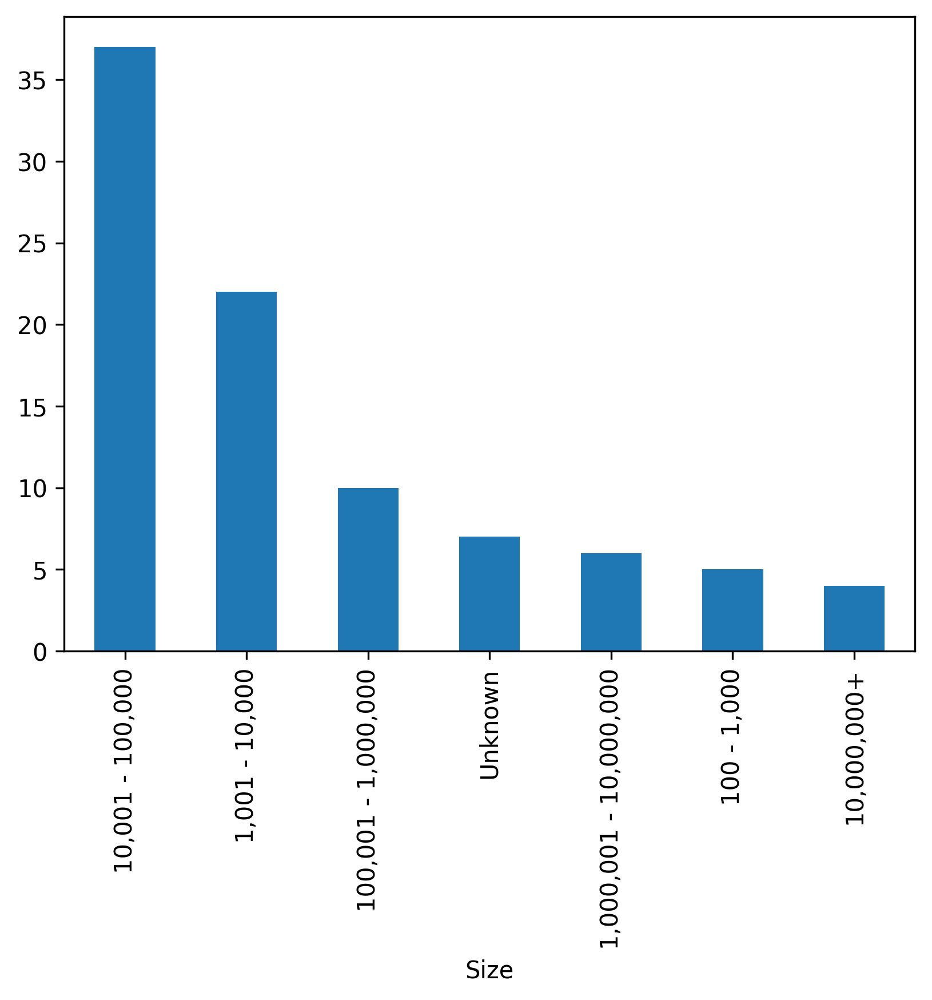

In [146]:
gov_df['Size'].value_counts().plot(kind='bar')

In [147]:
size_order = [
    '100 - 1,000',
    '1,001 - 10,000',
    '10,001 - 100,000',
    '100,001 - 1,000,000',
    '1,000,001 - 10,000,000',
    '10,000,000+',
    'Unknown'
]

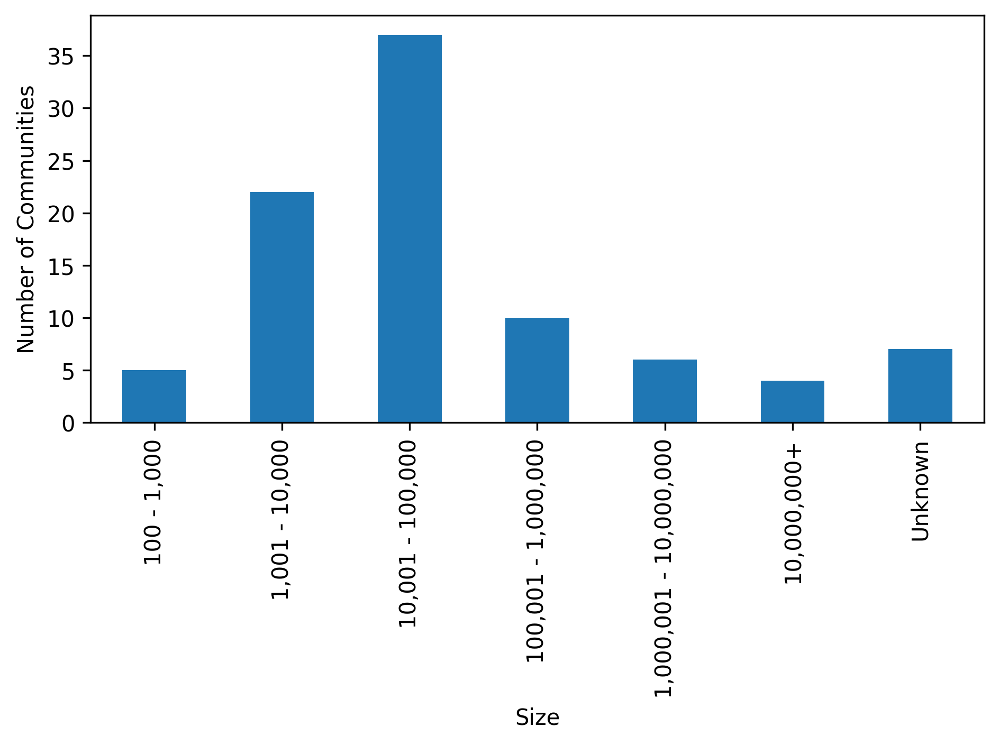

In [148]:
gov_df['Size'].value_counts().loc[size_order].plot.bar()
plt.ylabel("Number of Communities")

plt.tight_layout()
plt.savefig(fig_dir + 'communities_histogram_size.png')
plt.show()

In [149]:
gov_df['Size']

0        100,001 - 1,000,000
1           10,001 - 100,000
2           10,001 - 100,000
3                    Unknown
4             1,001 - 10,000
5        100,001 - 1,000,000
6        100,001 - 1,000,000
7           10,001 - 100,000
8        100,001 - 1,000,000
9           10,001 - 100,000
10               10,000,000+
11                   Unknown
12          10,001 - 100,000
13          10,001 - 100,000
14          10,001 - 100,000
15          10,001 - 100,000
16    1,000,001 - 10,000,000
17    1,000,001 - 10,000,000
18            1,001 - 10,000
19          10,001 - 100,000
20          10,001 - 100,000
21          10,001 - 100,000
22          10,001 - 100,000
23          10,001 - 100,000
24          10,001 - 100,000
25                   Unknown
26          10,001 - 100,000
27    1,000,001 - 10,000,000
28          10,001 - 100,000
29            1,001 - 10,000
30          10,001 - 100,000
31          10,001 - 100,000
32          10,001 - 100,000
33               10,000,000+
34            

### Geography 

In [150]:
gov_df['Geography'].value_counts()

Geography
North America                             12
Europe, West                               6
Africa                                     5
Asia, Middle East                          4
North America, Central America             4
Europe, North                              3
Europe, South, Italy                       3
Asia, India (northeast)                    3
Europe, East                               3
Asia, Southeast                            3
Europe, Italy                              3
Europe, South, Greece                      2
Asia, South                                2
South America, Brazil                      2
Asia, Southeast                            2
North America, Canada                      2
Africa, South, Botswana                    1
Africa, West, Nigeria                      1
North America, Alaska                      1
Asia, Southwest, Anatolia                  1
Asia, East                                 1
Europe, South                              1


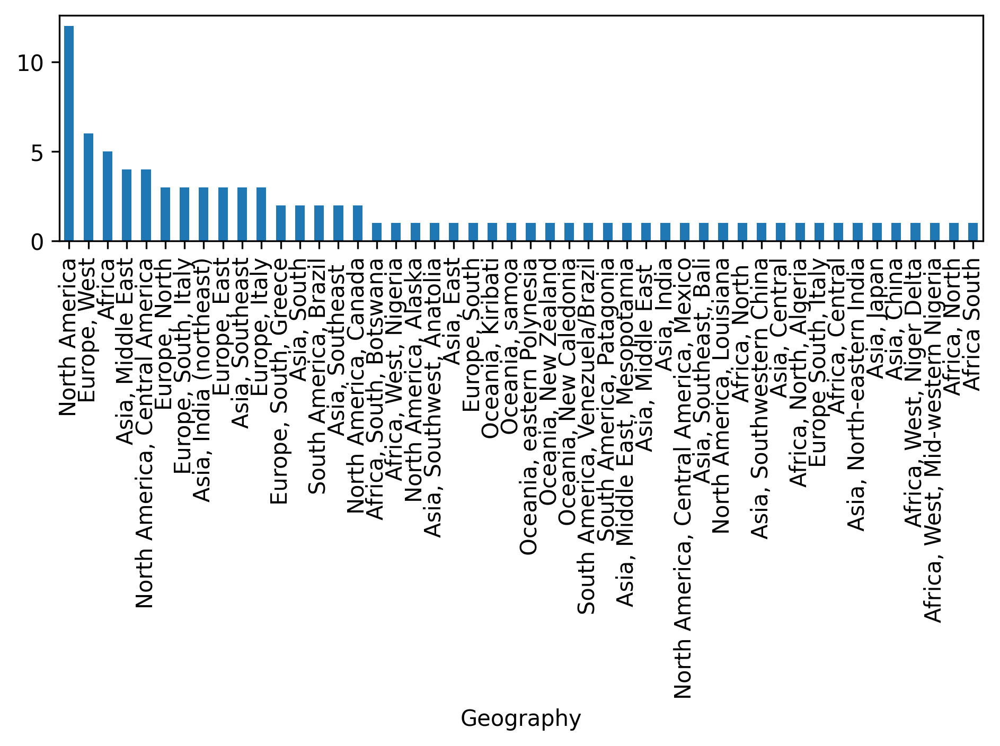

In [151]:
gov_df['Geography'].value_counts().plot(kind='bar')

plt.tight_layout()
plt.savefig(fig_dir + 'communities_histogram_geography.png')
plt.show()

In [152]:
"""
- Africa
- Europe
- Asia
- Middle East
- North America
- Central America
- South America
- Oceania
"""

'\n- Africa\n- Europe\n- Asia\n- Middle East\n- North America\n- Central America\n- South America\n- Oceania\n'

In [153]:
gov_df['Geography']

0                              Europe, North
1                           Asia, Southeast 
2                               Europe, West
3                          Asia, Middle East
4                  Asia, Southwest, Anatolia
5                              Europe, South
6             North America, Central America
7             Asia, Middle East, Mesopotamia
8                             Africa, North 
9                            Africa, Central
10                               Asia, China
11                              Europe, East
12                              Europe, West
13                              Europe, West
14                             Europe, North
15                         Asia, Middle East
16                             Africa, North
17                              Europe, West
18                   Africa, South, Botswana
19                             Europe, Italy
20                             Europe, Italy
21                     Europe, South, Greece
22        

### Geography 

In [154]:
gov_df.head()

,Name,Institutions,Mechanism,Notes,Time span,Geography,Continent,Size,Source,Metanotes,Heterogeneity,FC comments,expert check,Time span: Start,Time span: End,SCCS,is_SCCS,decision_making_mechanisms_include_consensus,decision_making_mechanisms_include_board_committee,decision_making_mechanisms_include_veto,enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,access_mechanisms_include_dreaming,decision_making_mechanisms_include_president_consul_chief_executive,access_mechanisms_include_child_participation,decision_making_mechanisms_include_assembly_central,enforcement_mechanisms_include_reputational_risk,access_mechanisms_include_open_political_unit,enforcement_mechanisms_include_destruction_of_property,decision_making_mechanisms_include_autocratic_leader_unbound,decision_making_mechanisms_include_rule_of_law,access_mechanisms_include_meritocracy,decision_making_mechanisms_include_council_central_,decision_making_mechanisms_include_bureaucracy,decision_making_mechanisms_include_majority_voting,decision_making_mechanisms_include_vote_by_proxy,decision_making_mechanisms_include_agenda_setting,decision_making_mechanisms_include_dual-sex_political_system,decision_making_mechanisms_include_constitution,decision_making_mechanisms_include_voting,enforcement_mechanisms_include_scrutiny_of_officials,decision_making_mechanisms_include_checks_and_balances,access_mechanisms_include_age_boundaries,decision_making_mechanisms_include_vote_by_show_of_hands,enforcement_mechanisms_include_judicial_review,access_mechanisms_include_payment_for_occupying_office,enforcement_mechanisms_include_self-help,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_consultation,enforcement_mechanisms_include_fines,enforcement_mechanisms_include_arbitration,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_balance_of_power,decision_making_mechanisms_include_delegation,access_mechanisms_include_blood_relations,decision_making_mechanisms_include_lobbying,decision_making_mechanisms_include_confederacy,access_mechanisms_include_heredity,enforcement_mechanisms_include_police,decision_making_mechanisms_include_representation,access_mechanisms_include_enfranchisement,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_assembly_local,access_mechanisms_include_election,access_mechanisms_include_female_participation,decision_making_mechanisms_include_remunerated_position,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_deliberation,decision_making_mechanisms_include_oath,decision_making_mechanisms_include_supermajority,decision_making_mechanisms_include_plurality_voting,decision_making_mechanisms_include_ratification_acclamation_only,access_mechanisms_include_property_requirement,access_mechanisms_include_gerontocracy,decision_making_mechanisms_include_coalition,decision_making_mechanisms_include_temporary_position_of_power_term_limits,decision_making_mechanisms_include_turnover_rotation,enforcement_mechanisms_include_paying_damages_compensation,enforcement_mechanisms_include_negotiation,enforcement_mechanisms_include_appeal,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_quorum,access_mechanisms_include_life_appointment,decision_making_mechanisms_include_kingchief-as-figurehead,decision_making_mechanisms_include_power_fluidity,access_mechanisms_include_matrilineality,access_mechanisms_include_popularity_,access_mechanisms_include_screening_process,decision_making_mechanisms_include_frequent_and_or_regular_meetings,enforcement_mechanisms_include_seizing_of_property,access_mechanisms_include_matriarchy,decision_making_mechanisms_include_leader_first_among_equals,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_exit,enforcement_mechanisms_include_civil_disobedience,decision_making_mechanisms_include_consent,decision_making_mech

In [155]:
gov_df['Region'].value_counts()

Region
Asia             25
Europe           22
North America    21
Africa           14
Oceania           5
South America     4
Name: count, dtype: int64

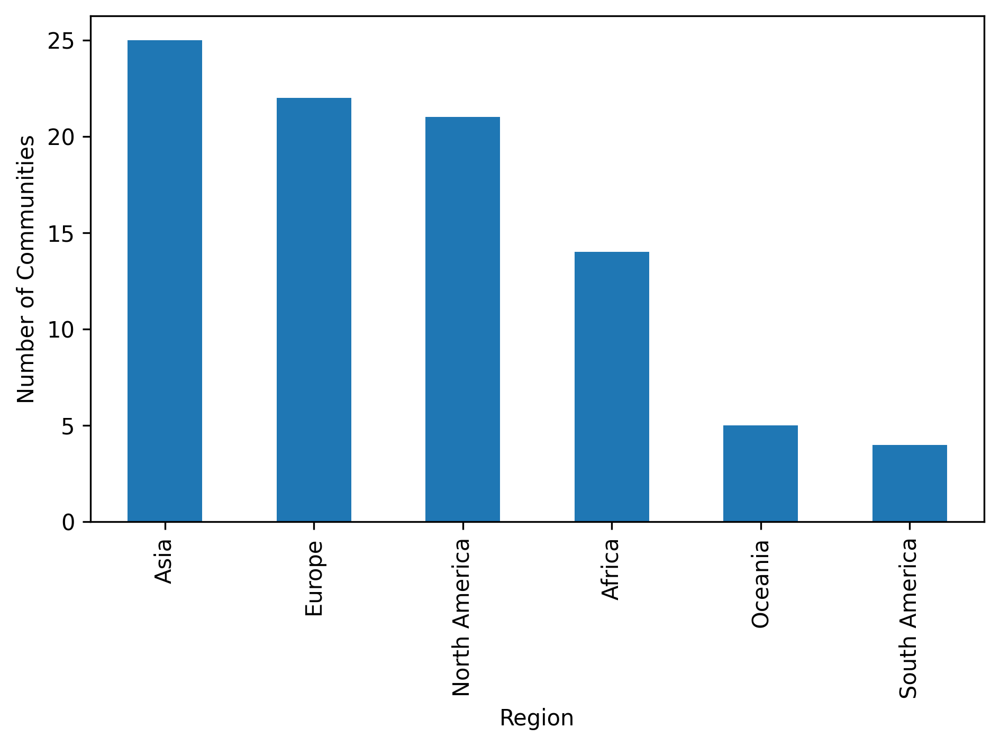

In [156]:
gov_df['Region'].value_counts().plot(kind='bar')
plt.ylabel("Number of Communities")

plt.tight_layout()
plt.savefig(fig_dir + 'communities_histogram_region.png')
plt.show()

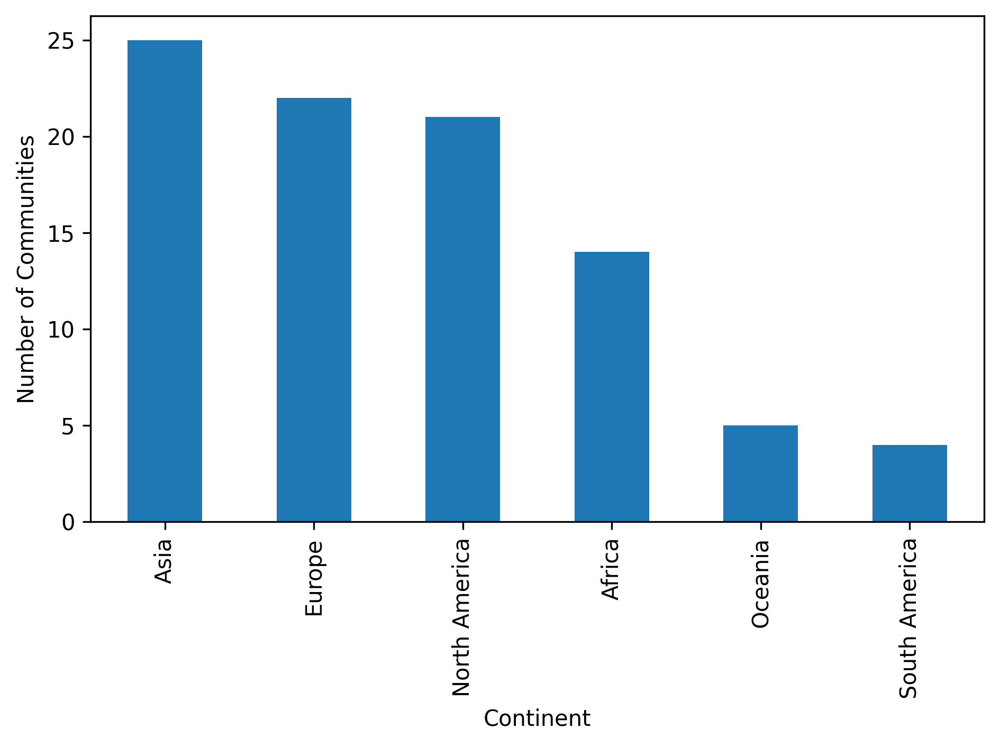

In [157]:
gov_df['Continent'].value_counts().plot(kind='bar')
plt.ylabel("Number of Communities")

plt.tight_layout()
plt.savefig(fig_dir + 'communities_histogram_continent.png')
plt.show()

Notes:
- Overrepresentation of European communities
- Need more representation of Oceania and Pacific Islanders, South America, Central America! 

## Mapping geographies


### Prep world map data to match the regions we have 

In [158]:
# Geopandas.dataset was deprecated
# Original naturalearth_lowres data is from: https://www.naturalearthdata.com/downloads/110m-cultural-vectors/
all_worldmap = gpd.read_file(
    "../data/naturalearth/ne_110m_admin_0_countries.shp"
)

In [159]:
all_worldmap

,featurecla,scalerank,LABELRANK,SOVEREIGNT,SOV_A3,ADM0_DIF,LEVEL,TYPE,TLC,ADMIN,ADM0_A3,GEOU_DIF,GEOUNIT,GU_A3,SU_DIF,SUBUNIT,SU_A3,BRK_DIFF,NAME,NAME_LONG,BRK_A3,BRK_NAME,BRK_GROUP,ABBREV,POSTAL,FORMAL_EN,FORMAL_FR,NAME_CIAWF,NOTE_ADM0,NOTE_BRK,NAME_SORT,NAME_ALT,MAPCOLOR7,MAPCOLOR8,MAPCOLOR9,MAPCOLOR13,POP_EST,POP_RANK,POP_YEAR,GDP_MD,GDP_YEAR,ECONOMY,INCOME_GRP,FIPS_10,ISO_A2,ISO_A2_EH,ISO_A3,ISO_A3_EH,ISO_N3,ISO_N3_EH,UN_A3,WB_A2,WB_A3,WOE_ID,WOE_ID_EH,WOE_NOTE,ADM0_ISO,ADM0_DIFF,ADM0_TLC,ADM0_A3_US,ADM0_A3_FR,ADM0_A3_RU,ADM0_A3_ES,ADM0_A3_CN,ADM0_A3_TW,ADM0_A3_IN,ADM0_A3_NP,ADM0_A3_PK,ADM0_A3_DE,ADM0_A3_GB,ADM0_A3_BR,ADM0_A3_IL,ADM0_A3_PS,ADM0_A3_SA,ADM0_A3_EG,ADM0_A3_MA,ADM0_A3_PT,ADM0_A3_AR,ADM0_A3_JP,ADM0_A3_KO,ADM0_A3_VN,ADM0_A3_TR,ADM0_A3_ID,ADM0_A3_PL,ADM0_A3_GR,ADM0_A3_IT,ADM0_A3_NL,ADM0_A3_SE,ADM0_A3_BD,ADM0_A3_UA,ADM0_A3_UN,ADM0_A3_WB,CONTINENT,REGION_UN,SUBREGION,REGION_WB,NAME_LEN,LONG_LEN,ABBREV_LEN,TINY,HOMEPART,MIN_ZOOM,MIN_LABEL,MAX_LABEL,LABEL_X,LABEL_Y,NE_ID,WIKIDATAID,NAME_AR,NAME_BN,NAME_DE,NAME_EN,NAME_ES,NAME_FA,NAME_FR,NAME_EL,NAME_HE,NAME_HI,NAME_HU,NAME_ID,NAME_IT,NAME_JA,NAME_KO,NAME_NL,NAME_PL,NAME_PT,NAME_RU,NAME_SV,NAME_TR,NAME_UK,NAME_UR,NAME_VI,NAME_ZH,NAME_ZHT,FCLASS_ISO,TLC_DIFF,FCLASS_TLC,FCLASS_US,FCLASS_FR,FCLASS_RU,FCLASS_ES,FCLASS_CN,FCLASS_TW,FCLASS_IN,FCLASS_NP,FCLASS_PK,FCLASS_DE,FCLASS_GB,FCLASS_BR,FCLASS_IL,FCLASS_PS,FCLASS_SA,FCLASS_EG,FCLASS_MA,FCLASS_PT,FCLASS_AR,FCLASS_JP,FCLASS_KO,FCLASS_VN,FCLASS_TR,FCLASS_ID,FCLASS_PL,FCLASS_GR,FCLASS_IT,FCLASS_NL,FCLASS_SE,FCLASS_BD,FCLASS_UA,geometry
0,Admin-0 country,1,6,Fiji,FJI,0,2,Sovereign country,1,Fiji,FJI,0,Fiji,FJI,0,Fiji,FJI,0,Fiji,Fiji,FJI,Fiji,None,Fiji,FJ,Republic of Fiji,None,Fiji,None,None,Fiji,None,5,1,2,2,8.899530e+05,11,2019,5496,2019,6. Developing region,4. Lower middle income,FJ,FJ,FJ,FJI,FJI,242,242,242,FJ,FJI,23424813,23424813,Exact WOE match as country,FJI,None,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,-99,-99,Oceania,Oceania,Melanesia,East Asia & Pacific,4,4,4,-99,1,0.0,3.0,8.0,177.975427,-17.826099,1159320625,Q712,فيجي,ফিজি,Fidschi,Fiji,Fiyi,فیجی,Fidji,Φίτζι,פיג'י,फ़िजी,Fidzsi-szigetek,Fiji,Figi,フィジー,피지,Fiji,Fidżi,Fiji,Фиджи,Fiji,Fiji,Фіджі,فجی,Fiji,斐济,斐濟,Admin-0 country,None,Admin-0 country,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((180 -16.06713, 180 -16.55522, ..."
1,Admin-0 country,1,3,United Republic of Tanzania,TZA,0,2,Sovereign country,1,United Republic of Tanzania,TZA,0,Tanzania,TZA,0,Tanzania,TZA,0,Tanzania,Tanzania,TZA,Tanzania,None,Tanz.,TZ,United Republic of Tanzania,None,Tanzania,None,None,Tanzania,None,3,6,2,2,5.800546e+07,16,2019,63177,2019,7. Least developed region,5. Low income,TZ,TZ,TZ,TZA,TZA,834,834,834,TZ,TZA,23424973,23424973,Exact WOE match as country,TZA,None,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,-99,-99,Africa,Africa,Eastern Africa,Sub-Saharan Africa,8,8,5,-99,1,0.0,3.0,8.0,34.959183,-6.051866,1159321337,Q924,تنزانيا,তানজানিয়া,Tansania,Tanzania,Tanzania,تانزانیا,Tanzanie,Τανζανία,טנזניה,तंज़ानिया,Tanzánia,Tanzania,Tanzania,タンザニア,탄자니아,Tanzania,Tanzania,Tanzânia,Танзания,Tanzania,Tanzanya,Танзанія,تنزانیہ,Tanzania,坦桑尼亚,坦尚尼亞,Admin-0 country,None,Admin-0 country,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,"POLYGON ((33.90371 -0.95, 34.07262 -1.05982, 3..."
2,Admin-0 country,1,7,Western Sahara,SAH,0,2,Indeterminate,1,Western Sahara,SAH,0,Western Sahara,SAH,0,Western Sahara,SAH,1,W. Sahara,Western Sahara,B28,W. Sahara,None,W. Sah.,WS,Sahrawi Arab Democratic Republic,None,Western Sahara,None,Self admin.; Claimed by Morocco,Western Sahara,None,4,7,4,4,6.032530e+05,11,2017,907,2007,7. Leas

In [160]:
worldmap = all_worldmap[['NAME', 'CONTINENT', 'REGION_UN', 'geometry']]

In [161]:
worldmap

,NAME,CONTINENT,REGION_UN,geometry
0,Fiji,Oceania,Oceania,"MULTIPOLYGON (((180 -16.06713, 180 -16.55522, ..."
1,Tanzania,Africa,Africa,"POLYGON ((33.90371 -0.95, 34.07262 -1.05982, 3..."
2,W. Sahara,Africa,Africa,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,Canada,North America,Americas,"MULTIPOLYGON (((-122.84 49, -122.97421 49.0025..."
4,United States of America,North America,Americas,"MULTIPOLYGON (((-122.84 49, -120 49, -117.0312..."
5,Kazakhstan,Asia,Asia,"POLYGON ((87.35997 49.21498, 86.59878 48.54918..."
6,Uzbekistan,Asia,Asia,"POLYGON ((55.96819 41.30864, 55.92892 44.99586..."
7,Papua New Guinea,Oceania,Oceania,"MULTIPOLYGON (((141.00021 -2.60015, 142.73525 ..."
8,Indonesia,Asia,Asia,"MULTIPOLYGON (((141.00021 -2.60015, 141.01706 ..."
9,Argentina,South America,Americas,"MULTIPOLYGON (((-68.63401 -52.63637, -68.25 -5..."


In [162]:
sorted(list(worldmap['NAME']))

['Afghanistan',
 'Albania',
 'Algeria',
 'Angola',
 'Antarctica',
 'Argentina',
 'Armenia',
 'Australia',
 'Austria',
 'Azerbaijan',
 'Bahamas',
 'Bangladesh',
 'Belarus',
 'Belgium',
 'Belize',
 'Benin',
 'Bhutan',
 'Bolivia',
 'Bosnia and Herz.',
 'Botswana',
 'Brazil',
 'Brunei',
 'Bulgaria',
 'Burkina Faso',
 'Burundi',
 'Cambodia',
 'Cameroon',
 'Canada',
 'Central African Rep.',
 'Chad',
 'Chile',
 'China',
 'Colombia',
 'Congo',
 'Costa Rica',
 'Croatia',
 'Cuba',
 'Cyprus',
 'Czechia',
 "Côte d'Ivoire",
 'Dem. Rep. Congo',
 'Denmark',
 'Djibouti',
 'Dominican Rep.',
 'Ecuador',
 'Egypt',
 'El Salvador',
 'Eq. Guinea',
 'Eritrea',
 'Estonia',
 'Ethiopia',
 'Falkland Is.',
 'Fiji',
 'Finland',
 'Fr. S. Antarctic Lands',
 'France',
 'Gabon',
 'Gambia',
 'Georgia',
 'Germany',
 'Ghana',
 'Greece',
 'Greenland',
 'Guatemala',
 'Guinea',
 'Guinea-Bissau',
 'Guyana',
 'Haiti',
 'Honduras',
 'Hungary',
 'Iceland',
 'India',
 'Indonesia',
 'Iran',
 'Iraq',
 'Ireland',
 'Israel',
 'Italy

In [163]:
worldmap['CONTINENT'].value_counts()

CONTINENT
Africa                     51
Asia                       47
Europe                     39
North America              18
South America              13
Oceania                     7
Seven seas (open ocean)     1
Antarctica                  1
Name: count, dtype: int64

In [164]:
# Add default regions for Oceania, Asia, Africa, and Europe
''' Swap for continent instead
worldmap.loc[(worldmap['CONTINENT'] == 'Oceania'), 'Region'] = 'Oceania'
worldmap.loc[(worldmap['CONTINENT'] == 'Asia'), 'Region'] = 'Asia'
worldmap.loc[(worldmap['CONTINENT'] == 'Africa'), 'Region'] = 'Africa'
worldmap.loc[(worldmap['CONTINENT'] == 'Europe'), 'Region'] = 'Europe'
'''

" Swap for continent instead\nworldmap.loc[(worldmap['CONTINENT'] == 'Oceania'), 'Region'] = 'Oceania'\nworldmap.loc[(worldmap['CONTINENT'] == 'Asia'), 'Region'] = 'Asia'\nworldmap.loc[(worldmap['CONTINENT'] == 'Africa'), 'Region'] = 'Africa'\nworldmap.loc[(worldmap['CONTINENT'] == 'Europe'), 'Region'] = 'Europe'\n"

In [165]:
north_america_countries = [
    'Bahamas',
    'Canada',
    'Cuba',
    'Dominican Rep.',
    'Greenland',
    'Haiti',
    'Jamaica',
    'Mexico',
    'Puerto Rico',
    'Trinidad and Tobago',
    'United States of America'
]

In [166]:
south_america_countries = [
    'Argentina',
    'Bolivia',
    'Brazil',
    'Chile',
    'Colombia',
    'Ecuador',
    'Falkland Is.',
    'Guyana',
    'Paraguay',
    'Peru',
    'Suriname',
    'Uruguay',
    'Venezuela'
]

In [167]:
central_america_countries = [
    'Belize',
    'Costa Rica',
    'El Salvador',
    'Guatemala',
    'Honduras',
    'Nicaragua',
    'Panama'
]

In [168]:
middle_east_countries = [
    'Cyprus',
    'Egypt',
    'Iran',
    'Iraq',
    'Israel',
    'Jordan',
    'Kuwait',
    'Lebanon',
    'Oman',
    'Palestine',
    'Qatar',
    'Saudi Arabia',
    'Syria',
    'Turkey',
    'United Arab Emirates',
    'Yemen'
]

In [169]:
# worldmap['NAME'].isin(central_america_countries)

In [170]:
# Add region for Central America
# worldmap.loc[(worldmap['NAME'].isin(central_america_countries)), 'Region'] = 'Central America'

In [171]:
# worldmap.loc[(worldmap['Region'] == 'Central America')]

In [172]:
# Add region for Middle East
# worldmap.loc[(worldmap['NAME'].isin(middle_east_countries)), 'Region'] = 'Middle East'

In [173]:
# worldmap.loc[(worldmap['Region'] == 'Middle East')]

In [174]:
# Add region for North America
# worldmap.loc[(worldmap['NAME'].isin(north_america_countries)), 'Region'] = 'North America'
# worldmap.loc[(worldmap['Region'] == 'North America')]

In [175]:
# Add region for South America
# worldmap.loc[(worldmap['NAME'].isin(south_america_countries)), 'Region'] = 'South America'
# worldmap.loc[(worldmap['Region'] == 'South America')]

In [176]:
worldmap

,NAME,CONTINENT,REGION_UN,geometry
0,Fiji,Oceania,Oceania,"MULTIPOLYGON (((180 -16.06713, 180 -16.55522, ..."
1,Tanzania,Africa,Africa,"POLYGON ((33.90371 -0.95, 34.07262 -1.05982, 3..."
2,W. Sahara,Africa,Africa,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,Canada,North America,Americas,"MULTIPOLYGON (((-122.84 49, -122.97421 49.0025..."
4,United States of America,North America,Americas,"MULTIPOLYGON (((-122.84 49, -120 49, -117.0312..."
5,Kazakhstan,Asia,Asia,"POLYGON ((87.35997 49.21498, 86.59878 48.54918..."
6,Uzbekistan,Asia,Asia,"POLYGON ((55.96819 41.30864, 55.92892 44.99586..."
7,Papua New Guinea,Oceania,Oceania,"MULTIPOLYGON (((141.00021 -2.60015, 142.73525 ..."
8,Indonesia,Asia,Asia,"MULTIPOLYGON (((141.00021 -2.60015, 141.01706 ..."
9,Argentina,South America,Americas,"MULTIPOLYGON (((-68.63401 -52.63637, -68.25 -5..."


In [177]:
worldmap['CONTINENT'].value_counts()

CONTINENT
Africa                     51
Asia                       47
Europe                     39
North America              18
South America              13
Oceania                     7
Seven seas (open ocean)     1
Antarctica                  1
Name: count, dtype: int64

In [178]:
worldmap.loc[worldmap['CONTINENT'].isna()]

,NAME,CONTINENT,REGION_UN,geometry


In [179]:
worldmap.describe()

,NAME,CONTINENT,REGION_UN,geometry
count,177,177,177,177
unique,177,8,6,177
top,Fiji,Africa,Africa,"MULTIPOLYGON (((180 -16.067132663642447, 180 -..."
freq,1,51,52,1


#### Merge regions on world map

In [180]:
worldmap.head()

,NAME,CONTINENT,REGION_UN,geometry
0,Fiji,Oceania,Oceania,"MULTIPOLYGON (((180 -16.06713, 180 -16.55522, ..."
1,Tanzania,Africa,Africa,"POLYGON ((33.90371 -0.95, 34.07262 -1.05982, 3..."
2,W. Sahara,Africa,Africa,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,Canada,North America,Americas,"MULTIPOLYGON (((-122.84 49, -122.97421 49.0025..."
4,United States of America,North America,Americas,"MULTIPOLYGON (((-122.84 49, -120 49, -117.0312..."


In [181]:
# test_map = worldmap.loc[(worldmap['Region'] == 'Central America')].union_all()

In [182]:
# print(test_map)

In [183]:
# regions_list = list(gov_df['Region'].unique())

In [184]:
continent_list = list(gov_df['Continent'].unique())

In [185]:
continent_list

['Europe', 'Asia', 'North America', 'Africa', 'South America', 'Oceania']

In [186]:
# regions_list

In [187]:
# region_map = pd.DataFrame(columns=['Region', 'geometry'])
# region_map['Region'] = regions_list

In [188]:
continent_map = pd.DataFrame(columns=['Continent', 'geometry'])
continent_map['Continent'] = continent_list

In [189]:
continent_map

,Continent,geometry
0,Europe,NaN
1,Asia,NaN
2,North America,NaN
3,Africa,NaN
4,South America,NaN
5,Oceania,NaN


In [190]:
worldmap['CONTINENT'].value_counts()

CONTINENT
Africa                     51
Asia                       47
Europe                     39
North America              18
South America              13
Oceania                     7
Seven seas (open ocean)     1
Antarctica                  1
Name: count, dtype: int64

### Plot communities into world map

In [191]:
from shapely.ops import unary_union
import pandas as pd

# Count communities per region
'''
region_counts = (
    gov_df['Region']
    .value_counts()
    .rename('count')
    .reset_index()
    .rename(columns={'index': 'Region'})
)

# Dissolve geometries in worldmap by region
region_geoms = worldmap.groupby('Region')['geometry'].apply(unary_union).reset_index()

# Merge geometries and counts into region_map
region_map = (
    region_map.drop(columns='geometry', errors='ignore')  # remove old column if exists
    .merge(region_geoms, on='Region', how='left')
    .merge(region_counts, on='Region', how='left')
)
'''

"\nregion_counts = (\n    gov_df['Region']\n    .value_counts()\n    .rename('count')\n    .reset_index()\n    .rename(columns={'index': 'Region'})\n)\n\n# Dissolve geometries in worldmap by region\nregion_geoms = worldmap.groupby('Region')['geometry'].apply(unary_union).reset_index()\n\n# Merge geometries and counts into region_map\nregion_map = (\n    region_map.drop(columns='geometry', errors='ignore')  # remove old column if exists\n    .merge(region_geoms, on='Region', how='left')\n    .merge(region_counts, on='Region', how='left')\n)\n"

In [192]:
# region_map

In [193]:
# Check that all communities are accounted for
# region_map['count'].sum()

In [194]:
worldmap

,NAME,CONTINENT,REGION_UN,geometry
0,Fiji,Oceania,Oceania,"MULTIPOLYGON (((180 -16.06713, 180 -16.55522, ..."
1,Tanzania,Africa,Africa,"POLYGON ((33.90371 -0.95, 34.07262 -1.05982, 3..."
2,W. Sahara,Africa,Africa,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,Canada,North America,Americas,"MULTIPOLYGON (((-122.84 49, -122.97421 49.0025..."
4,United States of America,North America,Americas,"MULTIPOLYGON (((-122.84 49, -120 49, -117.0312..."
5,Kazakhstan,Asia,Asia,"POLYGON ((87.35997 49.21498, 86.59878 48.54918..."
6,Uzbekistan,Asia,Asia,"POLYGON ((55.96819 41.30864, 55.92892 44.99586..."
7,Papua New Guinea,Oceania,Oceania,"MULTIPOLYGON (((141.00021 -2.60015, 142.73525 ..."
8,Indonesia,Asia,Asia,"MULTIPOLYGON (((141.00021 -2.60015, 141.01706 ..."
9,Argentina,South America,Americas,"MULTIPOLYGON (((-68.63401 -52.63637, -68.25 -5..."


In [195]:
worldmap = worldmap.rename(columns={'CONTINENT': 'Continent'})

In [114]:
# Merge conutries into continents 
continents_map = worldmap.dissolve(by='Continent', as_index=False)

In [210]:
continents_map = continents_map[['Continent', 'geometry', 'REGION_UN']]

In [211]:
continents_map

,Continent,geometry,REGION_UN
0,Africa,"MULTIPOLYGON (((-11.43878 6.78592, -11.70819 6...",Africa
1,Antarctica,"MULTIPOLYGON (((-61.13898 -79.98137, -60.61012...",Antarctica
2,Asia,"MULTIPOLYGON (((48.67923 14.0032, 48.23895 13....",Asia
3,Europe,"MULTIPOLYGON (((-53.55484 2.3349, -53.77852 2....",Europe
4,North America,"MULTIPOLYGON (((-155.22217 19.23972, -155.5421...",Americas
5,Oceania,"MULTIPOLYGON (((147.91405 -43.21152, 147.56456...",Oceania
6,Seven seas (open ocean),"POLYGON ((68.935 -48.625, 69.58 -48.94, 70.525...",Africa
7,South America,"MULTIPOLYGON (((-68.63999 -55.58002, -69.2321 ...",Americas


In [222]:
continent_counts = (
    gov_df
    .groupby('Continent')
    .size()
    .reset_index(name='count')
)

In [226]:
continent_counts

,Continent,count
0,Africa,14
1,Asia,25
2,Europe,22
3,North America,21
4,Oceania,5
5,South America,4


In [227]:
continent_map = continents_map.merge(
    continent_counts,
    on="Continent",
    how="left"
)

In [228]:
continent_map['count'] = continent_map['count'].fillna(0)

In [260]:
continent_map

,Continent,geometry,REGION_UN,count
0,Africa,"MULTIPOLYGON (((-11.43878 6.78592, -11.70819 6...",Africa,14.0
1,Antarctica,"MULTIPOLYGON (((-61.13898 -79.98137, -60.61012...",Antarctica,0.0
2,Asia,"MULTIPOLYGON (((48.67923 14.0032, 48.23895 13....",Asia,25.0
3,Europe,"MULTIPOLYGON (((-53.55484 2.3349, -53.77852 2....",Europe,22.0
4,North America,"MULTIPOLYGON (((-155.22217 19.23972, -155.5421...",Americas,21.0
5,Oceania,"MULTIPOLYGON (((147.91405 -43.21152, 147.56456...",Oceania,5.0
6,Seven seas (open ocean),"POLYGON ((68.935 -48.625, 69.58 -48.94, 70.525...",Africa,0.0
7,South America,"MULTIPOLYGON (((-68.63999 -55.58002, -69.2321 ...",Americas,4.0


In [264]:
continent_map = continent_map[continent_map['Continent'] != 'Seven seas (open ocean)']

In [265]:
max_val = continent_map['count'].max()

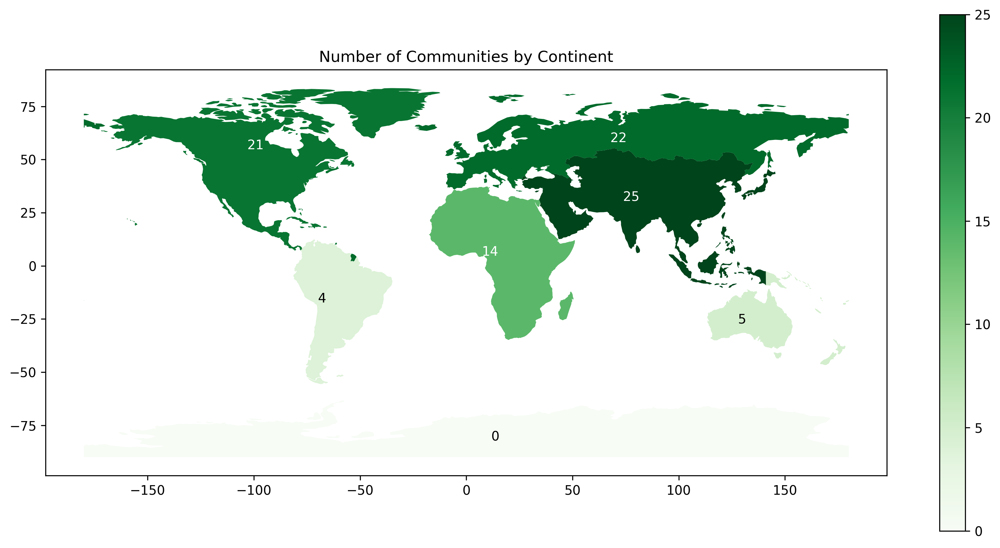

In [266]:
fig, ax = plt.subplots(1, 1, figsize=(12, 6))

continent_map.plot(
    column='count',
    cmap="Greens",
    linewidth=0.8,
    legend=True,
    ax=ax
)

# Add labels at region centroids
for idx, row in continent_map.iterrows():
    # For readability
    count_color = 'white' if row['count'] > max_val * 0.5 else 'black'
    
    if row['geometry'].is_empty:
        continue  # skip empty geometries
    centroid = row['geometry'].centroid
    ax.annotate(
        text=int(row['count']),
        xy=(centroid.x - 7, centroid.y),
        ha='center',
        va='center',
        fontsize=10,
        color=count_color,
    )

ax.set_title('Number of Communities by Continent')
# ax.axis("off")

plt.tight_layout()
plt.savefig(fig_dir + 'communities_map_region.png')

plt.show()

In [ ]:
'''
ax = region_map.plot(
    column='count',
    cmap='Greens',
    legend=True,
    figsize=(12, 6)
)

# Add labels at region centroids
for idx, row in region_map.iterrows():
    if row['geometry'].is_empty:
        continue  # skip empty geometries
    centroid = row['geometry'].centroid
    ax.annotate(
        text=int(row['count']),
        xy=(centroid.x, centroid.y),
        ha='center',
        va='center',
        fontsize=10,
        color='black',
    )

plt.title("Number of Communities per Region")
plt.tight_layout()
plt.savefig(fig_dir + 'communities_map_region.png')
plt.show()
'''

## Time Span

Note:
- Change Time span to "Time span: Start" and "Time span: Stop"

In [267]:
gov_df['Time span: Start'].value_counts()

Time span: Start
 1800    13
 1700    11
 1900     8
 1500     7
 900      5
 1600     4
 1200     4
 1000     3
 1300     3
-1500     3
 1100     3
 1400     2
-480      2
-4100     1
-1550     1
-600      1
 1081     1
-510      1
-1894     1
 1650     1
-1800     1
-200      1
 930      1
 1450     1
 400      1
-2700     1
-2400     1
-1200     1
-771      1
-400      1
-900      1
-508      1
-1920     1
 0        1
 300      1
 1750     1
Name: count, dtype: int64

<Axes: xlabel='Time span: Start'>

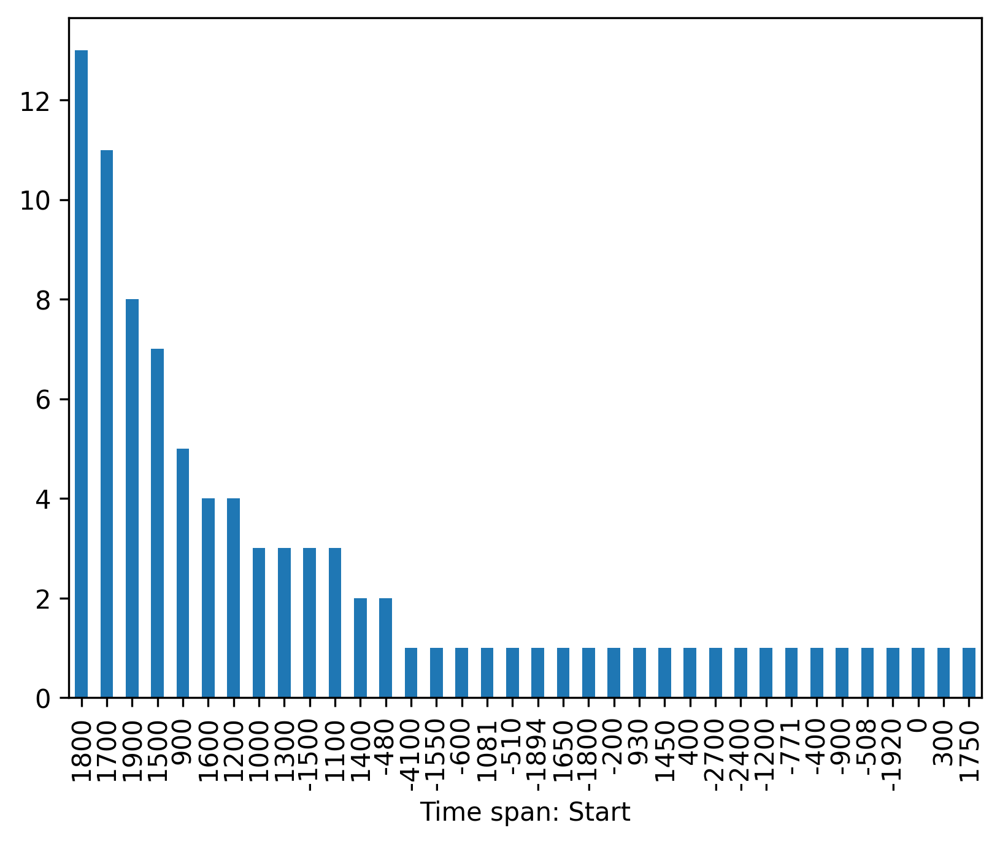

In [268]:
gov_df['Time span: Start'].value_counts().plot(kind='bar')

In [269]:
time_span_start_dates = gov_df['Time span: Start'].unique()

In [270]:
time_span_start_dates_order = sorted(time_span_start_dates)

In [271]:
time_span_start_dates_order

[np.int64(-4100),
 np.int64(-2700),
 np.int64(-2400),
 np.int64(-1920),
 np.int64(-1894),
 np.int64(-1800),
 np.int64(-1550),
 np.int64(-1500),
 np.int64(-1200),
 np.int64(-900),
 np.int64(-771),
 np.int64(-600),
 np.int64(-510),
 np.int64(-508),
 np.int64(-480),
 np.int64(-400),
 np.int64(-200),
 np.int64(0),
 np.int64(300),
 np.int64(400),
 np.int64(900),
 np.int64(930),
 np.int64(1000),
 np.int64(1081),
 np.int64(1100),
 np.int64(1200),
 np.int64(1300),
 np.int64(1400),
 np.int64(1450),
 np.int64(1500),
 np.int64(1600),
 np.int64(1650),
 np.int64(1700),
 np.int64(1750),
 np.int64(1800),
 np.int64(1900)]

<Axes: xlabel='Time span: Start'>

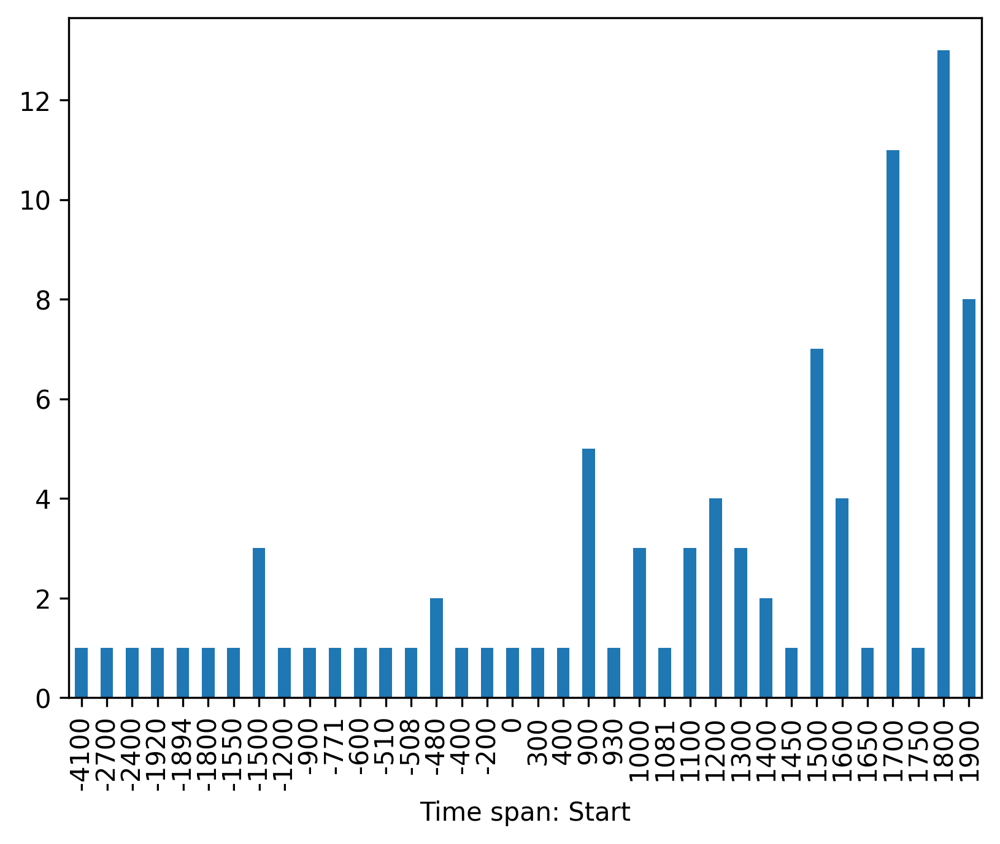

In [272]:
gov_df['Time span: Start'].value_counts().loc[time_span_start_dates_order].plot.bar()

In [273]:
gov_df['Time span: End'].value_counts()

Time span: End
 1900    24
 1800     9
 1600     6
 2000     5
 2023     5
 1850     4
 1400     3
-27       3
-500      3
 1200     2
 1300     2
-300      2
 1521     1
-1760     1
 1262     1
-3300     1
 1406     1
-1595     1
 1950     1
 1700     1
 1560     1
 0        1
 1804     1
 1100     1
-1000     1
-2300     1
-700      1
-221      1
 1500     1
-100      1
-600      1
-322      1
-1800     1
 700      1
 1880     1
Name: count, dtype: int64

In [274]:
# gov_df['Time span: End'].value_counts().plot(kind='bar')

<Axes: xlabel='Time span: End'>

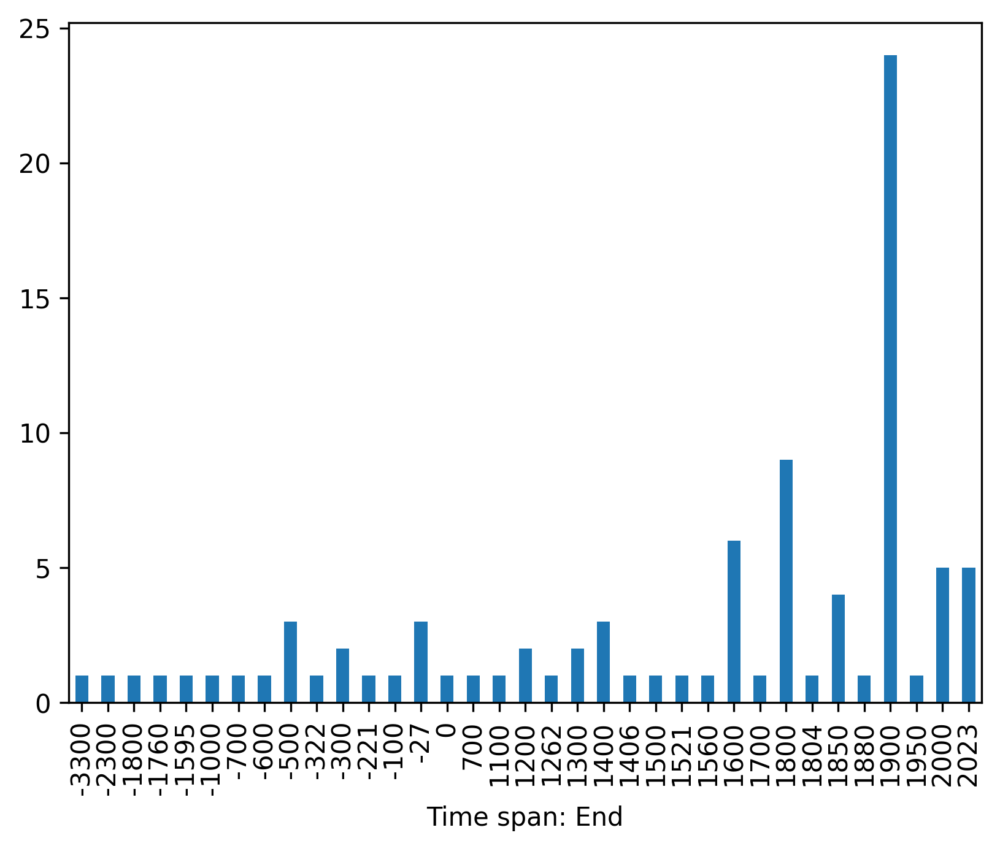

In [275]:
time_span_end_dates = gov_df['Time span: End'].unique()
time_span_end_dates_order = sorted(time_span_end_dates)

gov_df['Time span: End'].value_counts().loc[time_span_end_dates_order].plot.bar()

In [276]:
gov_df[['Time span: Start', 'Time span: End', 'Time span: Duration', 'Name']].head()

,Time span: Start,Time span: End,Time span: Duration,Name
0,-200,0,200,Aedui (Celtic Oppida)
1,1900,2023,123,Akha
2,300,1200,900,Amalfi
3,0,700,700,Arab nomads
4,-1920,-1800,120,Assur


In [277]:
dates_df = gov_df[['Time span: Start', 'Time span: Duration', 'Name']]

In [278]:
dates_df.head()

,Time span: Start,Time span: Duration,Name
0,-200,200,Aedui (Celtic Oppida)
1,1900,123,Akha
2,300,900,Amalfi
3,0,700,Arab nomads
4,-1920,120,Assur


In [279]:
dates_tuples = [tuple(x) for x in dates_df.to_numpy()]

In [280]:
dates_tuples

[(-200, 200, 'Aedui (Celtic Oppida)'),
 (1900, 123, 'Akha'),
 (300, 900, 'Amalfi'),
 (0, 700, 'Arab nomads'),
 (-1920, 120, 'Assur'),
 (-508, 186, 'Athens (Classical Period)'),
 (1100, 500, 'Aztec City-States'),
 (-900, 300, 'Babylonia'),
 (-400, 300, 'Carthage'),
 (900, 600, 'Central African communities'),
 (-771, 550, 'China (Spring and Autumn)'),
 (-1200, 500, 'Circassians'),
 (1200, 200, 'Cologne'),
 (900, 300, 'Communes (Medieval Europe)'),
 (1500, 300, 'Dutch Republic'),
 (-2400, 100, 'Ebla '),
 (-2700, 1700, 'Egypt '),
 (400, 700, 'England (Anglo Saxon)'),
 (1900, 100, 'G/wi'),
 (1300, 300, 'Genoa (doge)'),
 (1000, 300, 'Genoa (podesta)'),
 (-480, 453, 'Greek democracies'),
 (-480, 453, 'Greek oligarchies'),
 (1100, 700, 'Haudenosanee (Iroquois)'),
 (1450, 354, 'Hausa City-States'),
 (1900, 123, 'Hmong villages'),
 (930, 332, 'Iceland '),
 (900, 660, 'Igbo People'),
 (1400, 500, 'Ijo of the Eastern Niger Delta'),
 (1200, 600, 'Imperial and Free Towns of the Holy Roman Empire'),


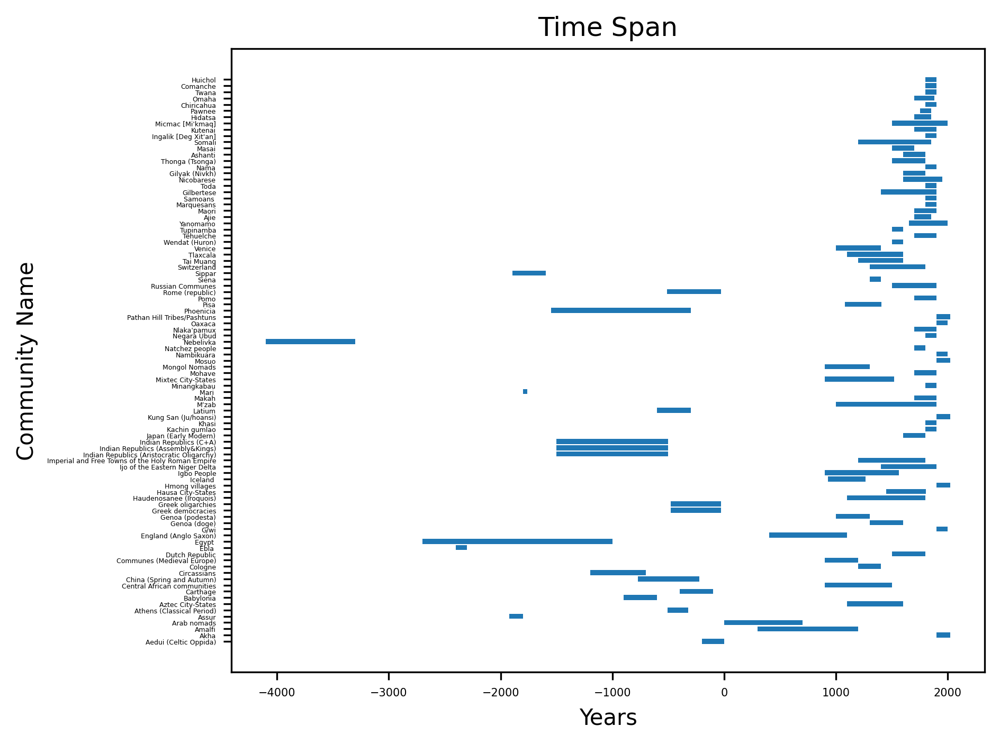

In [281]:
# create figure and plot
fig, ax = plt.subplots()
labels = []
for i, (start, duration, label) in enumerate(dates_tuples):
    labels.append(label)
    ax.broken_barh([(start, duration)], (i-0.4,0.8))

# set yticks at the middle of the bars
ax.set_yticks(range(len(dates_tuples)))
ax.set_yticklabels(labels)
ax.tick_params(axis='x', labelsize=5)
ax.tick_params(axis='y', labelsize=3)

ax.set_xlabel('Years')
ax.set_ylabel('Community Name')

plt.title('Time Span')
# plt.grid(True)
# plt.figure(figsize=(80, 80))

plt.tight_layout()
plt.savefig(fig_dir + 'communities_timeline.png')
plt.show()

/ Notes / TODO:
- x Mechanisms, Institution, Culture/Norms etc. 
- x Plot time span 
- Cluster communities by similarity (PCA) - can check w Seth
- CGI-specific analyses 

/
- Address remaining questions in doc: https://docs.google.com/document/d/1f1Qa25OGWWrvK5xrZjuLeqYn4WkgnyUH/edit
- CGIs: 
  - what do CGIs look like? 
  - How are they connected with other institutions? 
  - How many cgis per community, on average? 
  - how many non cgis, on average? How many institutions per community, on average? 
  - Does the variation interact with size, time or space?
  - Identify patterns in terms of:
      - Functions of the CGI
      - Level of jurisdiction (local/central) and membership (elite/commoners)
      - Within a type of CGI (say, assembly), what are the main sources of variation in terms of function and membership?
      - Possible interactions with size
  
- Mechanisms:
  - How many mechanisms in CGIs, on average? 
  - how many mechanisms in the community? 
  - What mechanisms prevail? 
  - What mechanisms prevail in CGIs compared to non-CGIs?
  - Does the variation interact with size, time or space?
  
- Region:
  - can we identify any regional characteristics? 
  - We should also provide a simple breakdown of each of the three features (time, place, size). 
  - How many communities in each?

/
- CGI network structures?

### TODO 

1. Finish descriptive analysis 
- x CGI analysis -- histogram for mechanisms
- x Timeline plotting 
- x Geography mapping
- x Clean up + reformat size


2. Mechanisms analysis 
- Mechanisms x geography, mechanisms x time, mechanisms x size


3. CGI Analysis 
- CGI-mechanism histogram 
- CGI Mechanisms x geography, mechanisms x time, mechanisms x size
- Correlation matrices for mechanisms and CGI mechanisms


4. Similarity clustering 
- Similarity clustering for Communities 

# Pairplots

In [282]:
data_df = gov_df.select_dtypes(include=[np.number]).dropna()

In [283]:
# sns.pairplot(data_df)

## TODO: Clustering communities by similarity